[![Le Baladin](https://img.shields.io/badge/Le_baladin-NGC_4490_le_génie_MegaPrime-blue.svg)](https://sites.google.com/view/astronomie-ut1/accueil)

_Dominique Touzan_<sup>1,2</sup>

<sup>1</sup>Notebook: https://anaconda.org/dtouzan/NGC4490/notebook

<sup>2</sup>Correspondance: [dtouzan@gmail.com](mailto:dtouzan@gmail.com)

Édition   1.0, révision 25/06/2020 - 16/07/2020

---
**Résumé** : Début d'été les observations sont plus réduites voir impossibles. La pise d'images du ciel profond est difficilement réalisable mais les grands télescopes nous fournissent avec leurs archives de bien belles images. En attendant la venue de la comète C/2020 F3 (NEOWISE) un traitement sur un des CCD de l'instrument MegaPrime du télescope CFHT (Canada-France-Hawaii Télescope) est facilement réalisable. Celui-ci représente la galaxie NGC 4490 et NGC 4485 (La galaxie de la lampe d'Aladin avec le petit génie qui sort) que j'ai imagée avec mon Intes M603 mi mars 2020 mais avec bien moin de résolution. Cette galaxie se trouve dans la constellation des Chiens de chasse au Nord-Ouest de l'étoile "Bet CVn". La visualisation de l'instrument MegaPrime avec astropy est facile à mettre en oeuvre mais pour le traitement des 36 CCD c'est une autre histoire, pour cela le document ne concerne qu'un seul CCD, à voir plus tard pour un traitement complet et automatique de tous les CCD. L'entête fits est affiché plus loin dans cette documentation pour faire apparaître toutes les informations concernant le CCD, le télescope et la prise de vue.

_Mots-clés_ : Galaxie - CFHT - MegaPrime

---
[![astropy](http://img.shields.io/badge/powered%20by-AstroPy-orange.svg?style=flat)](http://www.astropy.org/)

#### Chargement des paquets

In [1]:
import numpy as np
from matplotlib import pyplot, image, transforms
import matplotlib.pyplot as plt
from astropy.visualization import make_lupton_rgb
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
from astropy.wcs import WCS
from astropy.table import Table
from reproject.mosaicking import find_optimal_celestial_wcs
from reproject import reproject_interp
from reproject.mosaicking import reproject_and_coadd
from astropy import coordinates, units as u
from matplotlib.colors import LogNorm
from IPython.display import Image

#### Traitement de la série

Les quatre images au format fits 974324o.fits, 974325o.fits, 974327o.fits et 974328o.fits ont été téléchargées sur le site du CFHT Science Archive[[1]](#ref1) puis le procédé qui suit est appliqué sur chaque image N°23.

Lecture et affichage du fichier fits. Cela représente la matrice de l'instrument MegaPrime[[2]](#ref2)

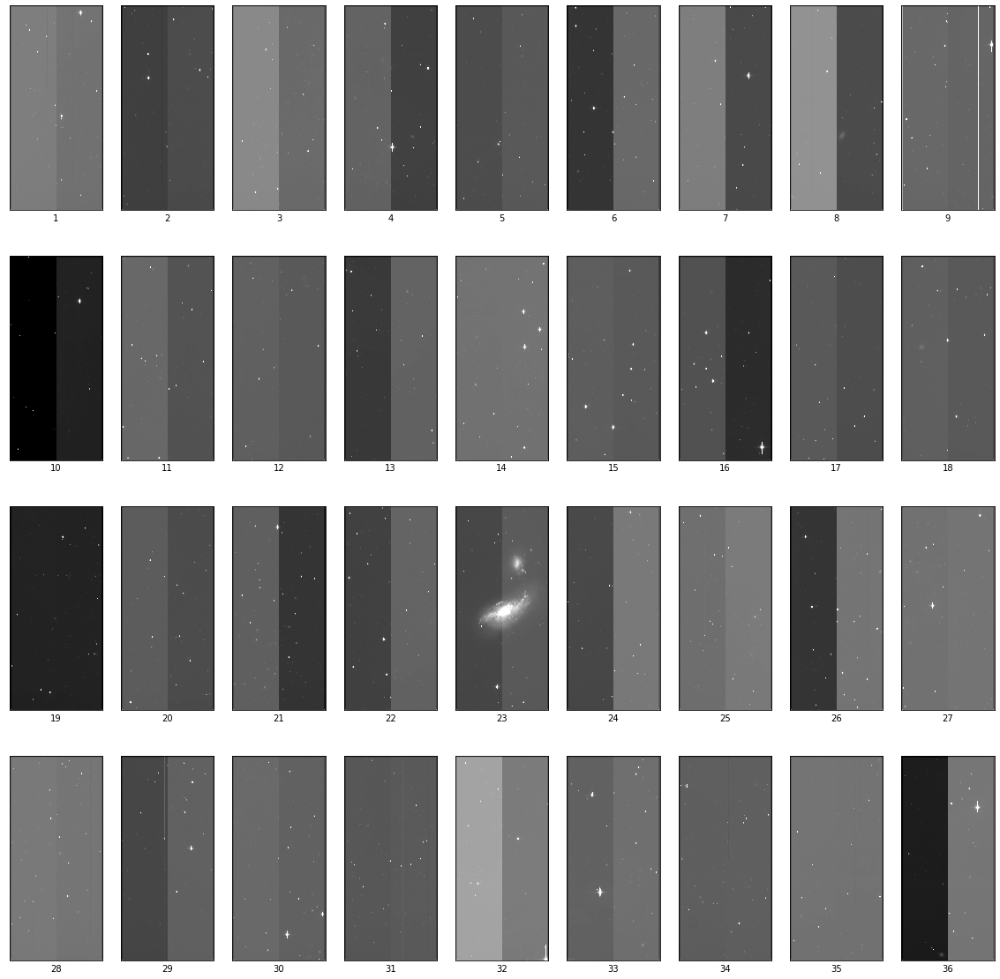

In [2]:
fits_name = get_pkg_data_filename('974324o.fits')
plt.figure(figsize=(20,20))

for index in range(1,37):
    fits_file = fits.open(fits_name)[index].data
    plt.subplot(4,9,index)
    plt.imshow(fits_file, cmap='gray',vmin=1000, vmax=2000, origin='Lower',norm=LogNorm())
    plt.xlabel(index)
    plt.xticks([])
    plt.yticks([])

plt.show()

Choix de la matrice CCD N°23 pour avoir la galaxie NGC 4490 puis affichage de l'entète pour d'autres renseignements

In [22]:
fits_file = fits.open(fits_name)[23]
fits_file.header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 2112 / length of data axis 1                          
NAXIS2  =                 4644 / length of data axis 2                          
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
COMMENT                                                                         
COMMENT Observation Summary                                                     
COMMENT -------------------                                                     
CMMTOBS = 'N/A     '                                                            
CMMTSEQ = 'DP5[4/5] - Ref + [10.0 3.0]'                                         
OBJECT  = 'NGC 4490'        

Choix d'une ligne de la matrice CCD pour savoir la variation à appliquer

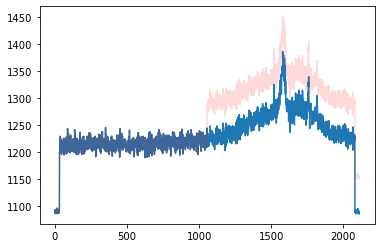

In [23]:
# Données modifiés
data_y = []
# Données de la matrice CCD
old_y = []
# x
xtab = []

#fits_file = fits.open(fits_name)[23]
for y in range(2682,2683):
    value = 0
    for x in range(0,fits_file.header['NAXIS1']-1):
        if x > 1055:
            value = 65
        old_y.append(fits_file.data[y][x])
        data_y.append(fits_file.data[y][x] - value)
        xtab.append(x)

plt.plot(xtab,data_y) 
plt.plot(xtab,old_y,color='red', alpha = 0.15) 
plt.show()

Application de la variation sur la matrice CCD N°23 puis sauvegarde du fichier fits pour la reprise sous un autre logiciel de tratement.

In [24]:
for y in range(0,fits_file.header['NAXIS2']-1):
    value = 0
    for x in range(int(fits_file.header['NAXIS1']/2),fits_file.header['NAXIS1']-1):
        value = 65
        fits_file.data[y][x] = fits_file.data[y][x] - value

# Mettre le numéro de l'image MegaPrime
fits_file.writeto('ngc4490-974324o.fits')

#### Affichage de l'image

Création de la mosaïc puis affichage. La résolution choisie est c'elle de l'entête mais il est possible de mettre une résolution inférieur pour un temps de traitement plus court. Il reste dans chaque image les points chauds et autres imperfections à retirer.

In [26]:
# table : liste de fichier fits
# hdus : liste des hdu des fichier fits
table = (fits_file, fits_file)
hdus = (table[0] ,table[1])

# Sortie des WCS et tailles des images et recalibration.
wcs_out, shape_out = find_optimal_celestial_wcs(hdus, frame='fk5',  projection='TAN', resolution=fits_file.header['PIXSCAL1'] * u.arcsec)

# Création de la mosaïc et des champs visuels
mosaic, footprint = reproject_and_coadd(hdus, wcs_out, shape_out=shape_out, reproject_function=reproject_interp, combine_function='mean', match_background=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


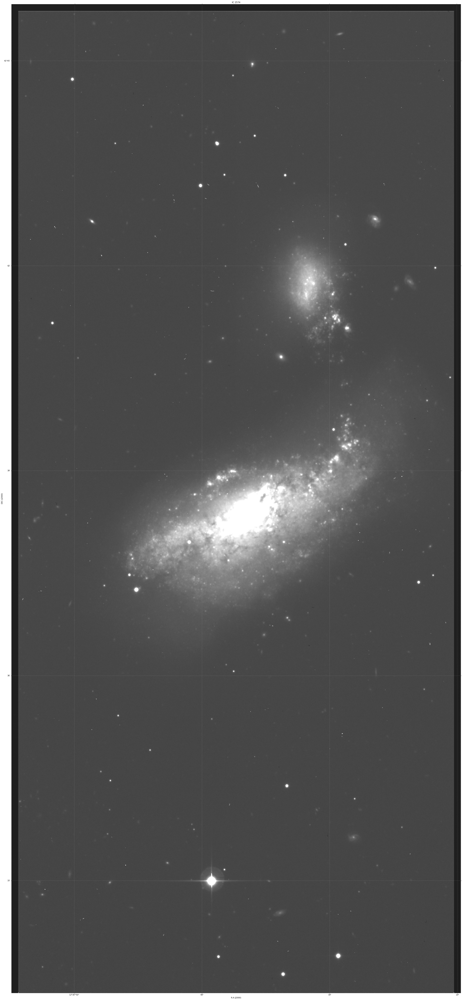

In [27]:
plt.figure(figsize=(100, 100))
ax = plt.subplot(1, 1, 1, projection = wcs_out)
ax.grid(b = True, linestyle = '--', color = 'w', alpha = 0.25)
im = ax.imshow(mosaic, cmap='gray', origin='lower', vmin=1000, vmax=2000,norm=LogNorm())
ax.set_xlabel('R.A (J2000)')
ax.set_ylabel('DEC (J2000)')
ax.set_title('NGC 4490')
plt.show()

#### Image finale
 
Après un traitement médian des quatre images de la CCD N°23 celle-ci apparaît bien moin bruitée. Tant de galaxies et des étoiles superbement rondes. Image fits finale[[3]](#ref3).

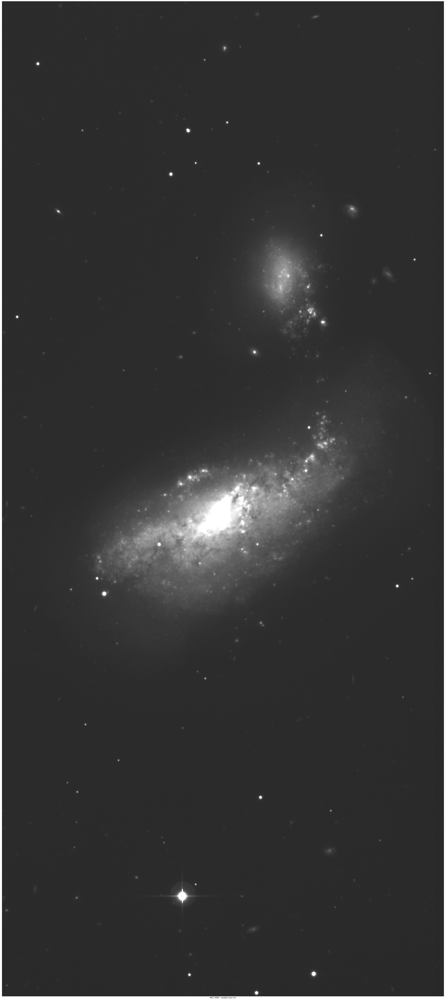

In [38]:
fits_name = get_pkg_data_filename('ngc4490-final-median.fits')
plt.figure(figsize=(100,100))

fits_file = fits.open(fits_name)[0].data
plt.subplot(1,1,1)
plt.xlabel('NGC 4490 - median sous Iris')
plt.imshow(fits_file, cmap='gray',vmin=1050, vmax=2400, origin='Lower',norm=LogNorm())
plt.xticks([])
plt.yticks([])

plt.show()

## Références
---
<a id='ref1'></a>
1. CFHT Science Archive, http://www.cadc-ccda.hia-iha.nrc-cnrc.gc.ca/en/search/?collection=CFHT&noexec=true 
<a id='ref2'></a>
2. CFHT Megaprime, https://www.cfht.hawaii.edu/Instruments/Imaging/Megacam/megaprimecomponents.html
<a id='ref3'></a>
3. Image Finale, https://drive.google.com/file/d/1jAQOO1romKzGp5v-cE40Ak7Qsi4Z5oWr/view?usp=sharing

## Remerciements
---
CFHT Observatory, https://www.cfht.hawaii.edu/


Based on observations obtained with MegaPrime/MegaCam, a joint project of CFHT and CEA/DAPNIA, at the Canada-France-Hawaii Telescope (CFHT) which is operated by the National Research Council (NRC) of Canada, the Institut National des Science de l'Univers of the Centre National de la Recherche Scientifique (CNRS) of France, and the University of Hawaii.

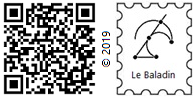

In [40]:
display(Image('signature.png'))